#Parallel Image Search

1712778 - Thống A Thảo

18120413 - Đỗ Liên Khoa

##Khái quát đề tài

Trong cuộc sống hiện nay, khi mọi người đều có quyền đăng tải nội dung lên mạng, nguồn thông tin dữ liệu trên mạng trở nên ngày một lớn hơn.

Với bộ dữ liệu lớn như vậy thì việc tìm kiếm các hình ảnh sẽ tốn rất nhiều thời gian.

##Ý tưởng

Ở mỗi hình ảnh, ta sẽ thực hiện rút trích các đặc trưng cơ bản của hình ảnh đó và đưa vào một vector.

Từ các vector đặc trưng đó ta sẽ tìm khoảng cách giữa các vector, khoảng cách càng ngắn thì 2 hình ảnh càng tương đồng.

Các đặc trưng sẽ được sử dụng:

* Mean intensity: Cường độ trung bình của từng channel
* Standard intensity: Độ lệch chuẩn của từng channel
* RGB Histogram: Mức phân phối cường độ của mỗi channel
* Hu Moments: Là một bộ 7 con số moment.

Dataset: Bộ dữ liệu được sử dụng là INRIA Holidays Dataset

Link: https://lear.inrialpes.fr/~jegou/data.php#holidays

##Thực hiện

###Tuần tự

In [ ]:
import cv2
import numpy as np
import numba as nb
import math
import os
import time
import matplotlib.pyplot as plt

In [ ]:
#Filter

#image = cv2.cvtColor(image, cv2.COLOR_RGB2GRAY)

sharpen = np.array(([0, -1, 0], [-1,  5, -1], [0, -1, 0]))

sobelX = np.array([[-1, 0, 1], [-2, 0, 2], [-1, 0, 1]])

sobelY = np.array(([-1, -2, -1], [0,  0,  0], [1,  2,  1]))

laplacian = np.array(([0,  1, 0], [1, -4, 1], [0,  1, 0]))

def convolution(img, image_roi, kernel):
# This function convolves the input kernel on the input image region of interest

  kernel_dimension = len(kernel)
  pixel_sum = 0

  for i in range(kernel_dimension):
    for j in range(kernel_dimension):
      pixel_kernel_value = image_roi[i, j]*kernel[i, j]
      pixel_sum = pixel_sum+pixel_kernel_value

  if pixel_sum < 0:
    return 0
  else:
    return pixel_sum % 255

def applyFilter(img, kernel):
  image = img
  filtered_image = np.zeros(image.shape)

  for row in range(1, len(image)-1):
    for col in range(1, len(image[row])-1):

      pixels = image[row-1:row+2, col-1:col+2]
      pixel_kernel = (pixels * kernel).sum()
      if pixel_kernel > 0:
        filtered_image[row, col] = pixel_kernel % 255
      else:
        filtered_image[row, col] = 0

  return filtered_image

def applyCannyEdge(img):
  """Returns image convolved with CannyEdge filter"""

  filtered_image = cv2.Canny(img, 50, 240)
  return filtered_image

In [ ]:
# Noice reduce

def convolution(img, image_roi, kernel):
# This function convolves the input kernel on the input image region of interest
  kernel_dimension = len(kernel)
  pixel_sum = 0

  for i in range(kernel_dimension):
    for j in range(kernel_dimension):
      pixel_kernel_value = image_roi[i, j]*kernel[i, j]
      pixel_sum = pixel_sum+pixel_kernel_value

  if pixel_sum < 0:
    return 0
  else:
    return pixel_sum % 255

def applyFilter(img, kernel):
  """ Returns convolved image
  Applies the input convolution filter onto the image
  """

  image = img
  kernel_dimension = len(kernel)
  kernel_margin = kernel_dimension//2
  filtered_image = np.zeros(image.shape)

  for row in range(kernel_margin, len(image)-kernel_margin):
    for col in range(kernel_margin, len(image[row])-kernel_margin):

      pixels = image[row-kernel_margin:row+kernel_margin+1, col-kernel_margin:col+kernel_margin+1]
      pixel_kernel = (pixels * kernel).sum()
    if pixel_kernel > 0:
      filtered_image[row, col] = pixel_kernel % 255
    else:
      filtered_image[row, col] = 0

    return filtered_image

def applySmallBlur(img):
  """Returns image applied with small blur filter"""

  kernel = np.ones((7, 7), dtype="float") * (1.0 / (7 * 7))
  image = img
  blured_image = cv2.filter2D(image, -1, kernel)
  return blured_image

def applyLargeBlur(img):
  """Returns image applied with large blur filter"""

  kernel = np.ones((21, 21), dtype="float") * (1.0 / (21 * 21))
  image = img
  blured_image = cv2.filter2D(image, -1, kernel)
  return blured_image

def applyGaussianBlur(img):
  """Returns image applied with Gaussian blur filter"""

  image = img
  filtered_image = cv2.GaussianBlur(image, (9, 9), 0)
  return filtered_image

In [ ]:
#Feature Vectors
def getMeanIntensity(img):
# Returns the mean intensity of image
  meanIntensity = []
  for channel in range(3):
    channel_mean = np.average(img[:, :, channel])
    meanIntensity.append(round(channel_mean, 5))

  return meanIntensity

def getStdIntensity(img):
# Returns the standard deviation of intensity of image
  stdIntensity = []
  for channel in range(3):
    channel_std = np.std(img[:, :, channel])
    stdIntensity.append(round(channel_std, 5))

  return stdIntensity

def getRGBHistogramVector(img):
# Returns the 3-D(RGB) Histogram vector of image
  histogram_3d = cv2.calcHist([img], [0, 1, 2], None, [12, 12, 12], [0, 256, 0, 256, 0, 256])
  histogram_3d = histogram_3d.ravel()
  RGBHistogram = list(histogram_3d)

  return RGBHistogram

def getHuMoments(img):
# Returns Hu-Moments vector of image

  canny_filtered = applyCannyEdge(img)
  canny_huMoments = cv2.HuMoments(cv2.moments(canny_filtered)).flatten()
  huVector = list(canny_huMoments.ravel())
  return huVector

def getFeatureVector(img):
  """ Return a python list of complete feature vectors
  Extracts Statistics, 3-D Histogram, HuMoments from image and appends into single list
  """
  featureVectors = []
  meanIntensity = getMeanIntensity(img)
  stdIntensity = getStdIntensity(img)
  rgbHistogram = getRGBHistogramVector(img)
  huVectors = getHuMoments(img)

  colorVectors = meanIntensity+stdIntensity+rgbHistogram
  featureVectors = colorVectors+huVectors
  return featureVectors

In [ ]:
def cosine_similarity(queryVector, vector):
# Computes cosine similarity between two vectors

  eps = 1e-10
  dot_product = sum(q*v for q, v in zip(queryVector, vector))

  queryMagnitude = math.sqrt(sum([val**2 for val in queryVector]))
  vectorMagnitude = math.sqrt(sum([val**2 for val in vector]))
  magnitude = (queryMagnitude*vectorMagnitude)+eps

  if not magnitude:
    return 0

  cosine_similarity = round(dot_product/magnitude, 5)
  return cosine_similarity

def chi2_distance(queryVector, vector):
# Computes chi-square distance between two vectors

  eps = 1e-10
  dists = [((q - v) ** 2) / (q + v + eps) for (q, v) in zip(queryVector, vector)]
  chi2_distance = 0.5 * sum(dists)
  chi2_distance = round(chi2_distance, 5)
  return chi2_distance

def SAD_distance(queryVector, vector):
# Computes SAD distance between two vectors

  dists = [abs(q-v) for (q, v) in zip(queryVector, vector)]
  SAD_distance = sum(dists)
  return SAD_distance

def performSearch(queryFeature, features):
# Return similarity indices of queryVector and databse images

  searchSimilarityScores = []

  for image in features:
    queryVector = queryFeature
    vector = features[image]
    similarity_score = chi2_distance(queryVector, vector)

    searchSimilarityScores.append((image, similarity_score))

  return searchSimilarityScores

In [ ]:
from google.colab import drive
drive.mount('/content/drive')
%cd drive/MyDrive/

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
/content/drive/MyDrive


In [ ]:
def extractFeatureVectors(image_path):
    # Extracts feature vectors for input image

    image = cv2.imread(image_path)
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    image = cv2.resize(image, (500, 500))
    vectors = getFeatureVector(image)

    imageName = image_path.split("/")[-1]
    return [imageName, vectors]


def ImageSearch(queryImage):
    # Performs Image Search using Query image

    image_db_path = "jpg/"
    image_paths = []
    for img in os.listdir(image_db_path):
        image_paths.append(image_db_path+img)

    features = {}
    for image in image_paths:
        imageName, vector = extractFeatureVectors(image)
        features[imageName] = vector

    queryImage_path = image_db_path + queryImage

    imageName, queryVector = extractFeatureVectors(queryImage_path)

    results = performSearch(queryVector, features)
    results.sort(key=lambda res: res[1])

    return results

In [ ]:
def getImg(img):
    image_db_path = "jpg/"
    image = cv2.imread(image_db_path+img)
    image = cv2.resize(image, (500,500))
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    return image

Sequential Time : 88.84736418100056


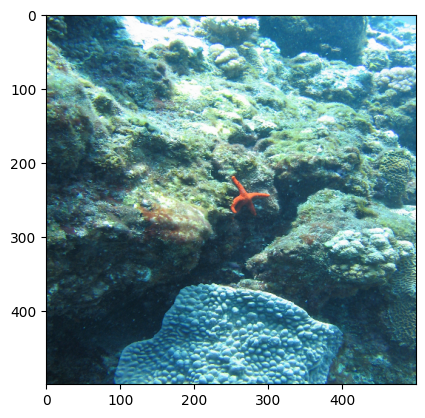

In [ ]:
start = time.perf_counter()
search_results = ImageSearch("101700.jpg")
end = time.perf_counter()
print(f"Sequential Time : {end-start}")
seq_time = end-start
plt.imshow(getImg("101700.jpg"))

In [ ]:
for sr in search_results[:20]:
    print(sr)

('101700.jpg', 0.0)
('101701.jpg', 15147.08892)
('106903.jpg', 72948.83734)
('106901.jpg', 75857.30457)
('101900.jpg', 80407.70608)
('106900.jpg', 84384.87336)
('106902.jpg', 96378.84856)
('101901.jpg', 99182.02534)
('103101.jpg', 104225.27086)
('103901.jpg', 104225.27086)
('103100.jpg', 108786.77197)
('103900.jpg', 108786.77197)
('106402.jpg', 110618.90526)
('106801.jpg', 118011.90224)
('106403.jpg', 118787.77029)
('103102.jpg', 120002.28973)
('103902.jpg', 120002.28973)
('106300.jpg', 125612.28889)
('106301.jpg', 126343.38398)
('106800.jpg', 127184.37762)


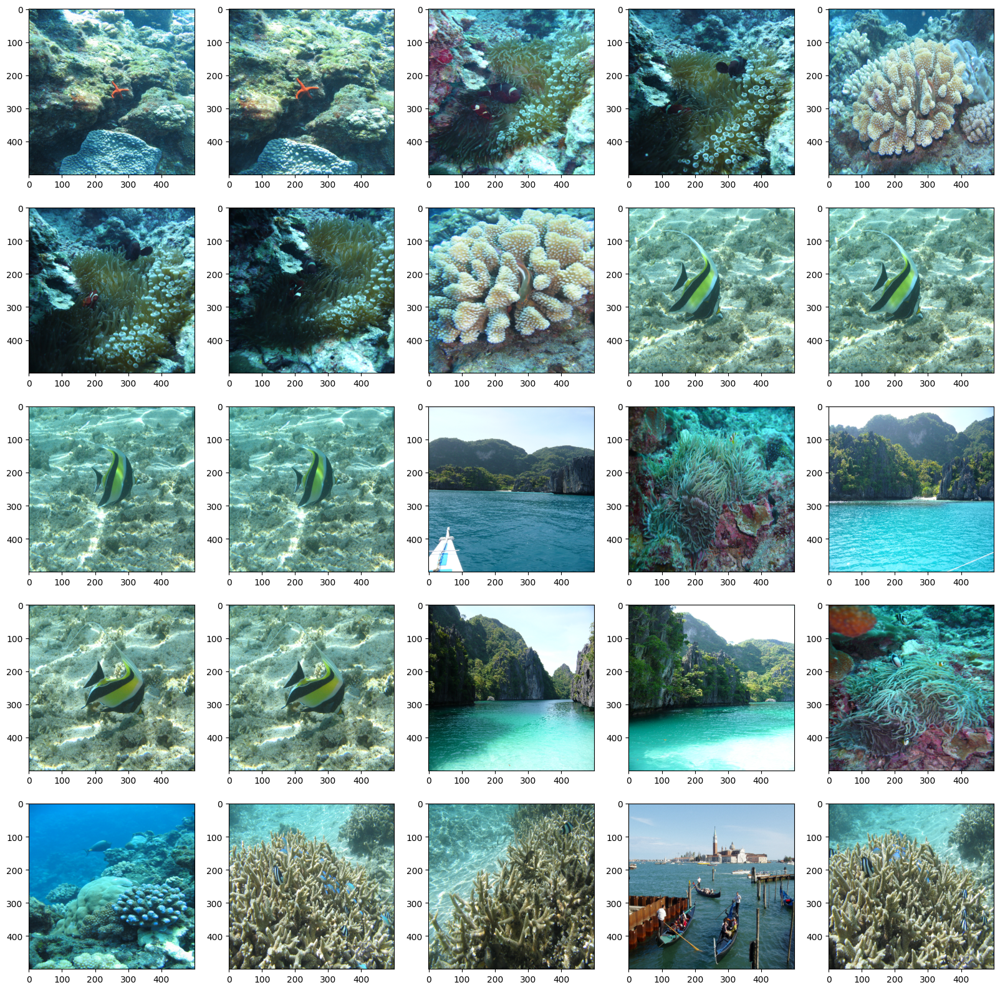

In [ ]:
plt.figure(figsize=(20,20))

for i in range(25):
    plt.subplot(5,5,i+1)
    plt.imshow(getImg(search_results[i][0]))

plt.show()

###Ver1

In [ ]:
#V1
from numba import float32

@nb.jit(nopython = True)
def getMeanIntensity_v1(img):
# Returns the mean intensity of image
  meanIntensity = []
  for channel in range(3):
    channel_mean = np.average(img[:, :, channel])
    meanIntensity.append(round(channel_mean, 5))

  return meanIntensity

@nb.jit(nopython = True)
def getStdIntensity_v1(img):
# Returns the standard deviation of intensity of image
  stdIntensity = []
  for channel in range(3):
    channel_std = np.std(img[:, :, channel])
    stdIntensity.append(round(channel_std, 5))

  return stdIntensity

def getRGBHistogramVector_v1(img):
# Returns the 3-D(RGB) Histogram vector of image
  histogram_3d = cv2.calcHist([img], [0, 1, 2], None, [12, 12, 12], [0, 256, 0, 256, 0, 256])
  histogram_3d = histogram_3d.ravel()
  RGBHistogram = list(histogram_3d)

  return RGBHistogram

def getHuMoments_v1(img):
# Returns Hu-Moments vector of image

  canny_filtered = applyCannyEdge(img)
  canny_huMoments = cv2.HuMoments(cv2.moments(canny_filtered)).flatten()
  huVector = list(canny_huMoments.ravel())
  return huVector

def getFeatureVector_v1(img):
  """ Return a python list of complete feature vectors
  Extracts Statistics, 3-D Histogram, HuMoments from image and appends into single list
  """
  featureVectors = []
  meanIntensity = getMeanIntensity_v1(img)
  stdIntensity = getStdIntensity_v1(img)
  rgbHistogram = getRGBHistogramVector_v1(img)
  huVectors = getHuMoments_v1(img)

  colorVectors = meanIntensity+stdIntensity+rgbHistogram
  featureVectors = colorVectors+huVectors
  return featureVectors

def extractFeatureVectors_v1(image_path):
    # Extracts feature vectors for input image

    image = cv2.imread(image_path)
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    image = cv2.resize(image, (500, 500))
    vectors = getFeatureVector_v1(image)

    imageName = image_path.split("/")[-1]
    return [imageName, vectors]

#@nb.jit(nopython = True, parallel = True)
def chi2_distance_v1(queryVector, vector):
# Computes chi-square distance between two vectors

  eps = 1e-10
  dists = [((q - v) ** 2) / (q + v + eps) for (q, v) in zip(queryVector, vector)]
  chi2_distance = 0.5 * sum(dists)
  chi2_distance = round(chi2_distance, 5)
  return chi2_distance

def performSearch_v1(queryFeature, features):
# Return similarity indices of queryVector and databse images

  searchSimilarityScores = []

  for image in features:
    queryVector = queryFeature
    vector = features[image]
    similarity_score = chi2_distance_v1(queryVector, vector)

    searchSimilarityScores.append((image, similarity_score))

  return searchSimilarityScores

def ImageSearch_v1(queryImage):
    # Performs Image Search using Query image

    image_db_path = "jpg/"
    image_paths = []
    for img in os.listdir(image_db_path):
        image_paths.append(image_db_path+img)

    features = {}
    for image in image_paths:
        imageName, vector = extractFeatureVectors_v1(image)
        features[imageName] = vector

    queryImage_path = image_db_path + queryImage

    imageName, queryVector = extractFeatureVectors_v1(queryImage_path)

    results = performSearch_v1(queryVector, features)
    results.sort(key=lambda res: res[1])

    return results

In [ ]:
start = time.perf_counter()
search_results_nb = ImageSearch_v1("101700.jpg")
end = time.perf_counter()
print(f"With numba Time : {end-start}")
nb_time = end-start

With numba Time : 83.4483501349996


In [ ]:
for sr in search_results_nb[:20]:
    print(sr)

('101700.jpg', 0.0)
('101701.jpg', 15147.08892)
('106903.jpg', 72948.83734)
('106901.jpg', 75857.30457)
('101900.jpg', 80407.70608)
('106900.jpg', 84384.87336)
('106902.jpg', 96378.84856)
('101901.jpg', 99182.02534)
('103101.jpg', 104225.27086)
('103901.jpg', 104225.27086)
('103100.jpg', 108786.77197)
('103900.jpg', 108786.77197)
('106402.jpg', 110618.90526)
('106801.jpg', 118011.90224)
('106403.jpg', 118787.77029)
('103102.jpg', 120002.28973)
('103902.jpg', 120002.28973)
('106300.jpg', 125612.28889)
('106301.jpg', 126343.38398)
('106800.jpg', 127184.37762)


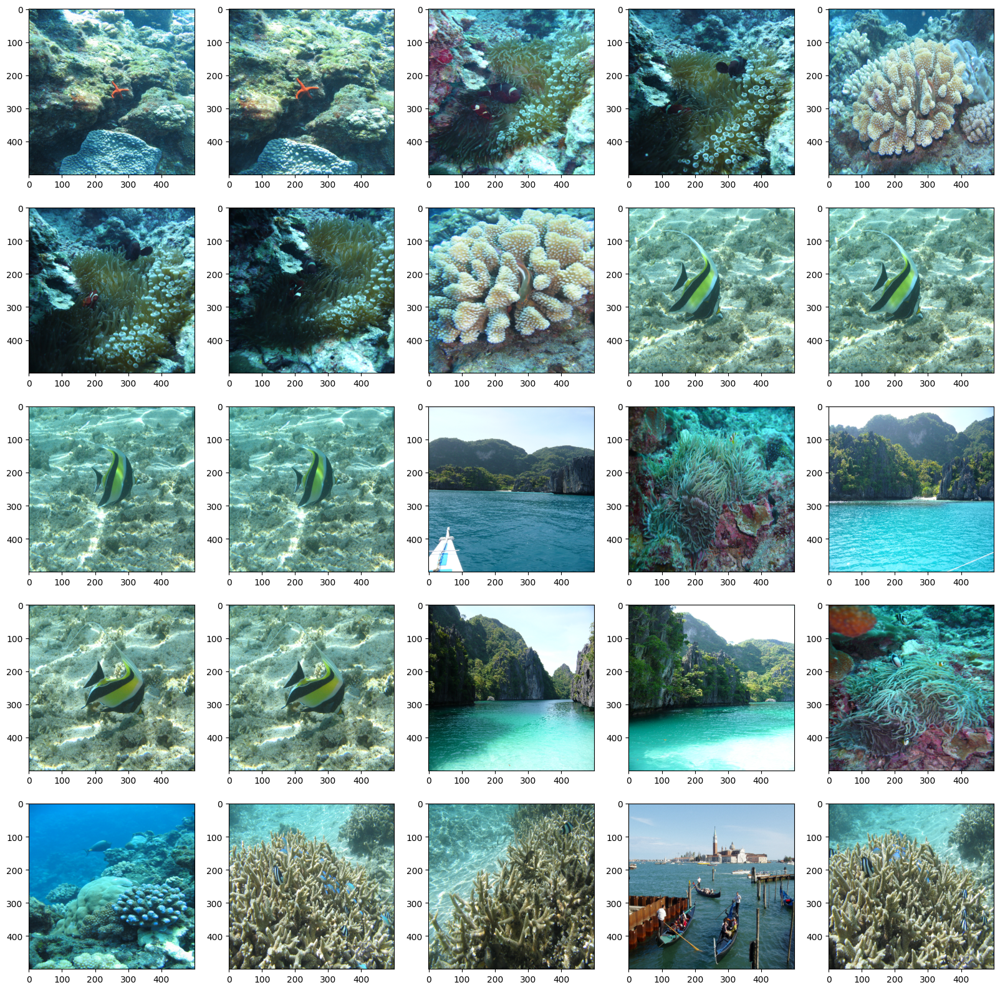

In [ ]:
plt.figure(figsize=(20,20))

for i in range(25):
    plt.subplot(5,5,i+1)
    plt.imshow(getImg(search_results_nb[i][0]))

plt.show()

Nhận xét:
  - Tốc độ được cải thiện.
  - Kết quả thu được là tương đồng nhau.

###Ver2

In [ ]:
from numba import cuda
@cuda.jit
def getSum_parallel(img: np.array, result: int):
  r, c = cuda.grid(2)
  if r < img.shape[0] and c < img.shape[1]:
    result = img[r][c]

def getMeanIntensity_parallel(img):
  block_size = (32,32)
  img_height = img.shape[0]
  img_width = img.shape[1]
  grid_size = (math.ceil(img_height / block_size[0]), math.ceil(img_width / block_size[1]))

  meanIntensity = []
  for channel in range(3):
    result = 0
    getSum_parallel[grid_size, block_size](np.array(img[:, :, channel].tolist()), result)
    meanIntensity.append(round(result/(img.shape[0] * img.shape[1]), 5))

  return meanIntensity

def getFeatureVector_parallel(img):
  """ Return a python list of complete feature vectors
  Extracts Statistics, 3-D Histogram, HuMoments from image and appends into single list
  """
  featureVectors = []
  meanIntensity = getMeanIntensity_parallel(img)
  stdIntensity = getStdIntensity_v1(img)
  rgbHistogram = getRGBHistogramVector_v1(img)
  huVectors = getHuMoments_v1(img)

  colorVectors = meanIntensity+stdIntensity+rgbHistogram
  featureVectors = colorVectors+huVectors
  return featureVectors

def extractFeatureVectors_parallel(image_path):
    # Extracts feature vectors for input image

    image = cv2.imread(image_path)
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    image = cv2.resize(image, (500, 500))
    vectors = getFeatureVector_parallel(image)

    imageName = image_path.split("/")[-1]
    return [imageName, vectors]

def ImageSearch_parallel(queryImage):
    # Performs Image Search using Query image

    image_db_path = "jpg/"
    image_paths = []
    for img in os.listdir(image_db_path):
        image_paths.append(image_db_path+img)

    features = {}
    for image in image_paths:
        imageName, vector = extractFeatureVectors_parallel(image)
        features[imageName] = vector

    queryImage_path = image_db_path + queryImage

    imageName, queryVector = extractFeatureVectors_parallel(queryImage_path)

    results = performSearch_v1(queryVector, features)
    results.sort(key=lambda res: res[1])

    return results

In [ ]:
start = time.perf_counter()
search_results_cd = ImageSearch_parallel("101700.jpg")
end = time.perf_counter()
print(f"With cuda Time : {end-start}")
cd_time = end-start

/usr/local/lib/python3.10/dist-packages/numba/cuda/cudadrv/devicearray.py:885: NumbaPerformanceWarning: Host array used in CUDA kernel will incur copy overhead to/from device.
  warn(NumbaPerformanceWarning(msg))


With cuda Time : 136.91823124100029


In [ ]:
for sr in search_results_nb[:20]:
    print(sr)

('101700.jpg', 0.0)
('101701.jpg', 15147.08892)
('106903.jpg', 72948.83734)
('106901.jpg', 75857.30457)
('101900.jpg', 80407.70608)
('106900.jpg', 84384.87336)
('106902.jpg', 96378.84856)
('101901.jpg', 99182.02534)
('103101.jpg', 104225.27086)
('103901.jpg', 104225.27086)
('103100.jpg', 108786.77197)
('103900.jpg', 108786.77197)
('106402.jpg', 110618.90526)
('106801.jpg', 118011.90224)
('106403.jpg', 118787.77029)
('103102.jpg', 120002.28973)
('103902.jpg', 120002.28973)
('106300.jpg', 125612.28889)
('106301.jpg', 126343.38398)
('106800.jpg', 127184.37762)


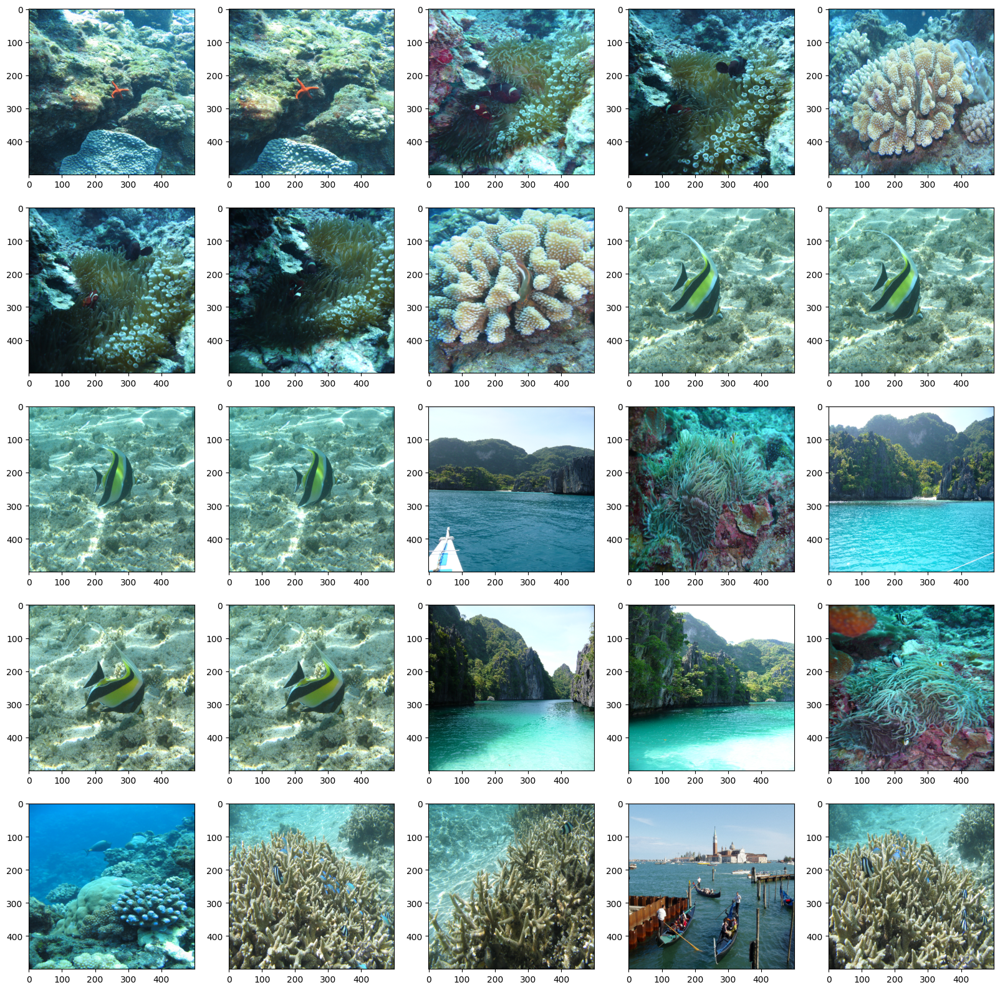

In [ ]:
plt.figure(figsize=(20,20))

for i in range(25):
    plt.subplot(5,5,i+1)
    plt.imshow(getImg(search_results_cd[i][0]))

plt.show()

Nhận xét:
  - Tốc độ bị giảm đi so với bản tuần tự.
  - Kết quả thu được là tương đồng nhau.

##Thử thách

  - Nhóm vẫn chưa đạt được kết quả như mong muốn.
  - Thời gian làm đồ án của nhóm bị trễ hơn lịch khá xa.